# End-to-End ML Project: Consumer Complaints Classification
## Using TensorFlow for Preprocessing + Training

**Key Innovation:** This notebook uses TensorFlow native tools for:
- Text preprocessing (`tf.keras.layers.TextVectorization`)
- Data pipelines (`tf.data.Dataset`)
- Feature engineering (TensorFlow ops)
- Model training (TensorFlow/Keras)

**Benefits:**
- Preprocessing is part of the model → deploy as single artifact
- GPU-accelerated preprocessing
- No sklearn/nltk dependency in production
- Consistent preprocessing in train/inference

---

## Course Project - DTI6302

**Dataset:** Consumer Complaints (HuggingFace)  
**URL:** https://huggingface.co/datasets/milesbutler/consumer_complaints

## Table of Contents
1. [Phase 1: Dataset Selection & Documentation](#phase1)
2. [Phase 2: Exploratory Data Analysis (EDA)](#phase2)
3. [Phase 3: Feature Engineering with TensorFlow](#phase3)
4. [Phase 4: Model Training Pipeline (TensorFlow Native)](#phase4)
5. [Phase 5: Model Training with TensorFlow](#phase5)
6. [Phase 6: Model Evaluation](#phase6)

<a id='phase1'></a>
# Phase 1: Dataset Selection & Documentation (5 points)

## 1.1 Dataset Description

**Dataset Name:** Consumer Complaints Dataset  
**Source:** HuggingFace Datasets / CFPB  
**URL:** https://huggingface.co/datasets/milesbutler/consumer_complaints

### Dataset Overview
- **Size:** ~2.8 million consumer complaints
- **Features:** 18 columns including complaint text, product, company, dates, etc.
- **Target Variable:** Product (18 categories)
- **Domain:** Financial Services / Consumer Protection
- **Task:** Multi-class Text Classification

### Project Justification

**Why This Dataset?**
1. **Real-World Impact:** Automate complaint routing (save $10-30 per complaint)
2. **Rich Text Data:** Complex narratives with real customer language
3. **Business Value:** Faster resolution, better customer service
4. **Technical Challenge:** Perfect for end-to-end TensorFlow pipeline
5. **Scale:** Sufficient data for deep learning

**Impact:**
- Reduce manual routing time from hours to seconds
- Improve customer satisfaction through faster responses
- Detect systemic issues through pattern analysis

## Restore from GG Drive

In [ ]:

# RESTORE FROM GOOGLE DRIVE
from google.colab import drive
import shutil
import os

print("RESTORING FROM GOOGLE DRIVE")

# Mount Drive
print("\nMounting Google Drive...")
drive.mount('/content/drive')

# List available backups
print("\nAvailable backups:")
drive_path = '/content/drive/MyDrive'
backups = [d for d in os.listdir(drive_path) if d.startswith('MLOps_Consumer_Complaints_')]
backups.sort(reverse=True)  # Most recent first

if not backups:
    print("No backups found!")
else:
    for i, backup in enumerate(backups[:5], 1):  # Show last 5
        print(f"   {i}. {backup}")

    # Use most recent backup
    latest_backup = backups[0]
    backup_path = f'{drive_path}/{latest_backup}'

    print(f"\nRestoring from: {latest_backup}")

    # Restore models
    if os.path.exists(f'{backup_path}/models'):
        shutil.copytree(f'{backup_path}/models', 'models', dirs_exist_ok=True)
        print("   Models restored")

    # Restore figures
    if os.path.exists(f'{backup_path}/figures'):
        shutil.copytree(f'{backup_path}/figures', 'figures', dirs_exist_ok=True)
        print("Figures restored")

    # Restore logs
    if os.path.exists(f'{backup_path}/logs'):
        shutil.copytree(f'{backup_path}/logs', 'logs', dirs_exist_ok=True)
        print("Logs restored")

    # Load data info
    if os.path.exists(f'{backup_path}/data_info.json'):
        import json
        with open(f'{backup_path}/data_info.json', 'r') as f:
            data_info = json.load(f)
        print(f"\n  Training data info:")
        print(f"      • Sample size: {data_info.get('sample_size', 0):,}")
        print(f"      • Classes: {data_info.get('num_classes', 0)}")

    # Load results
    if os.path.exists(f'{backup_path}/results_summary.json'):
        with open(f'{backup_path}/results_summary.json', 'r') as f:
            results = json.load(f)
        print(f"\n   Training results:")
        for result in results:
            print(f"      • {result['model']}: {result['test_accuracy']} accuracy")
    print("SESSION RESTORED!")



RESTORING FROM GOOGLE DRIVE

Mounting Google Drive...
Mounted at /content/drive

Available backups:
No backups found!


## 1.2 Setup and Imports

In [ ]:
!pip install --upgrade datasets fsspec

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 kB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.0/201.0 kB 31.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 22.9 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
  Attempting uninstall: datasets
    Found existing installation: datasets 2.14.4
    Uninstalling datasets-2.14.4:
      Successfully uninstalled datasets-2.14.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 25.2.1 requires pyarrow<20.0.0a0,>=14.0.0; platform_machine == "x86_64", but you have pyarr

In [ ]:
import pandas as pd
from datasets import load_dataset
from google.colab import auth # Import the auth module

# 1. Configuration
BUCKET_NAME = "project-37461c1b-635d-4cf2-af5d-mlops-models"
FILE_NAME = "consumer_complaints_eval.jsonl"
GCS_PATH = f"gs://{BUCKET_NAME}/{FILE_NAME}"

# Authenticate to Google Cloud (needed for GCS access)
auth.authenticate_user()

# 2. Load the Test Split from Hugging Face
print("Downloading dataset...")
dataset = load_dataset("milesbutler/consumer_complaints", split="test", download_mode="force_redownload")

# 3. Convert to Pandas
df = dataset.to_pandas()

# 4. Select and Rename Columns
# Vertex AI needs distinct names. Let's use 'content' for text and 'label' for the answer.
df = df[['Consumer Complaint', 'Product']]
df.columns = ['content', 'label']

# 5. Clean Data (Optional but recommended)
# Ensure no empty text or labels
df = df.dropna()

# 6. Save directly to GCS as JSONL
print(f"Uploading to {GCS_PATH}...")
df.to_json(GCS_PATH, orient='records', lines=True)

print("Upload Complete!")
print(f"Go to the UI and paste: {GCS_PATH}")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/171 [00:00<?, ?B/s]

dataset_infos.json: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/127M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/42.4M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/208398 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/69416 [00:00<?, ? examples/s]

Uploading to gs://project-37461c1b-635d-4cf2-af5d-mlops-models/consumer_complaints_eval.jsonl...
Upload Complete!
Go to the UI and paste: gs://project-37461c1b-635d-4cf2-af5d-mlops-models/consumer_complaints_eval.jsonl


In [ ]:
!pip install pyarrow pandas

In [ ]:
!pip install tensorflow==2.15.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 70.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 81.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 72.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 100.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.4/77.4 kB 7.8 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uni

In [ ]:
# install tensorflow_data_validation
!pip install tensorflow_data_validation

# Import packages
import os
import tensorflow as tf
import tempfile, urllib, zipfile
import tensorflow_data_validation as tfdv
from sklearn.model_selection import train_test_split
import keras
import re
import string

from tensorflow.python.lib.io import file_io
from tensorflow_data_validation.utils import slicing_util
from tensorflow_metadata.proto.v0.statistics_pb2 import DatasetFeatureStatisticsList, DatasetFeatureStatistics

# Set TF's logger to only display errors to avoid internal warnings being shown
tf.get_logger().setLevel('ERROR')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.9/99.9 kB 16.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.5/173.5 kB 24.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of tensorflow-serving-api to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of grpcio-status to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of grpcio-status to determine whic

In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from datetime import datetime
import os
import re
from collections import Counter

# HuggingFace
from datasets import load_dataset

# TensorFlow - Using for EVERYTHING
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks
import tensorflow_data_validation as tfdv

In [ ]:

print(f"TensorFlow: {tf.__version__}")

TensorFlow: 2.16.2


In [ ]:
import sys
print(sys.version)

3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


## 1.3 Load Dataset

In [ ]:

# Random seeds
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

# Read training data file from Hugging Face
file_path = 'https://huggingface.co/datasets/milesbutler/consumer_complaints/resolve/main/data/train-00000-of-00001.parquet'

# Download the file
import requests
response = requests.get(file_path)
response.raise_for_status()  # Raise an exception for bad status codes

# Save the file locally
with open('test-00000-of-00001.parquet', 'wb') as f:
    f.write(response.content)

# Read the downloaded parquet file
df = pd.read_parquet('test-00000-of-00001.parquet', engine='pyarrow')


print(df.head())



# Sample for Colab
SAMPLE_SIZE = 15000
if len(df) > SAMPLE_SIZE:
    df = df.sample(n=SAMPLE_SIZE, random_state=RANDOM_SEED).reset_index(drop=True)

# Clean names
df = df.rename(columns={'Consumer Complaint': 'complaint_text'})
df = df.dropna(subset=['complaint_text', 'Product'])

print(f"Dataset shape: {df.shape}")
print(f"Unique products: {df['Product'].nunique()}")
df.head()

  Date received                                            Product  \
0    07/29/2017  Credit reporting, credit repair services, or o...   
1    09-09-2015                                   Credit reporting   
2    04/26/2017                                       Student loan   
3    11/27/2017  Credit reporting, credit repair services, or o...   
4    09-02-2016                                           Mortgage   

            Sub-product                                              Issue  \
0      Credit reporting               Incorrect information on your report   
1                  None             Incorrect information on credit report   
2  Private student loan                      Struggling to repay your loan   
3      Credit reporting  Problem with a credit reporting company's inve...   
4          FHA mortgage           Loan servicing, payments, escrow account   

                                           Sub-issue  \
0                           Account status incorrect  

,Date received,Product,Sub-product,Issue,Sub-issue,complaint_text,Company Public Response,Company,State,ZIP code,Tags,Consumer consent provided?,Submitted via,Date Sent to Company,Company Response to Consumer,Timely response?,Consumer disputed?,Complaint ID,Unnamed: 18
0,07/14/2017,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Personal information incorrect,I 've called and started investigations on num...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",GA,301XX,Servicemember,Consent provided,Web,07/14/2017,Closed with explanation,Yes,None,2575016,NaN
1,08-07-2015,Mortgage,Conventional fixed mortgage,"Loan modification,collection,foreclosure",None,I have been trying to getting a modification w...,None,NATIONSTAR MORTGAGE,FL,330XX,None,Consent provided,Web,08-07-2015,Closed with explanation,Yes,No,1509035,NaN
2,04-08-2015,Mortgage,FHA mortgage,"Loan servicing, payments, escrow account",None,I made my XXXX mortgage payment early in XXXX ...,Company believes it acted appropriately as aut...,"PENNYMAC LOAN SERVICES, LLC.",FL,342XX,None,Consent provided,Web,04-08-2015,Closed with explanation,Yes,No,1321678,NaN
3,01/24/2017,Credit card,None,Rewards,None,I applied Chase Sapphire Reserve credit card i...,None,JPMORGAN CHASE & CO.,TX,782XX,None,Consent provided,Web,01/24/2017,Closed with explanation,Yes,Yes,2306173,NaN
4,10/26/2017,Debt collection,Other debt,False statements or representation,Attempted to collect wrong amount,I would like to dispute the enclosed collectio...,Company believes it acted appropriately as aut...,"N.A.R., Inc.",CA,926XX,None,Consent provided,Web,11-07-2017,Closed with explanation,Yes,None,2712799,NaN


<a id='phase2'></a>
# Phase 2: Exploratory Data Analysis (EDA)

## 2.1 Target Distribution

Product Distribution:
Debt collection                                                                 3555
Credit reporting, credit repair services, or other personal consumer reports    2568
Mortgage                                                                        2351
Credit reporting                                                                1732
Credit card                                                                      982
Student loan                                                                     866
Bank account or service                                                          801
Credit card or prepaid card                                                      586
Consumer Loan                                                                    490
Checking or savings account                                                      367
Money transfer, virtual currency, or money service                               163
Vehicle loan or lease                      

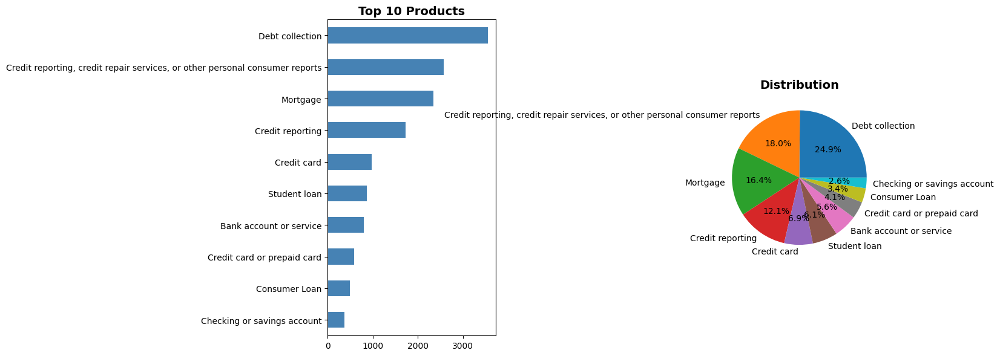

In [ ]:
# Product distribution
product_counts = df['Product'].value_counts()
print("Product Distribution:")
print(product_counts)

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

product_counts.head(10).plot(kind='barh', ax=axes[0], color='steelblue')
axes[0].set_title('Top 10 Products', fontsize=14, fontweight='bold')
axes[0].invert_yaxis()

product_counts.head(10).plot(kind='pie', ax=axes[1], autopct='%1.1f%%')
axes[1].set_title('Distribution', fontsize=14, fontweight='bold')
axes[1].set_ylabel('')

plt.tight_layout()
plt.show()

## 2.2 Text Statistics

Text Length Statistics:
        text_length    word_count
count  15000.000000  15000.000000
mean    1053.956400    192.529200
std     1050.399749    190.493349
min        6.000000      1.000000
25%      388.000000     71.000000
50%      734.000000    134.000000
75%     1348.000000    247.000000
max    17741.000000   3080.000000


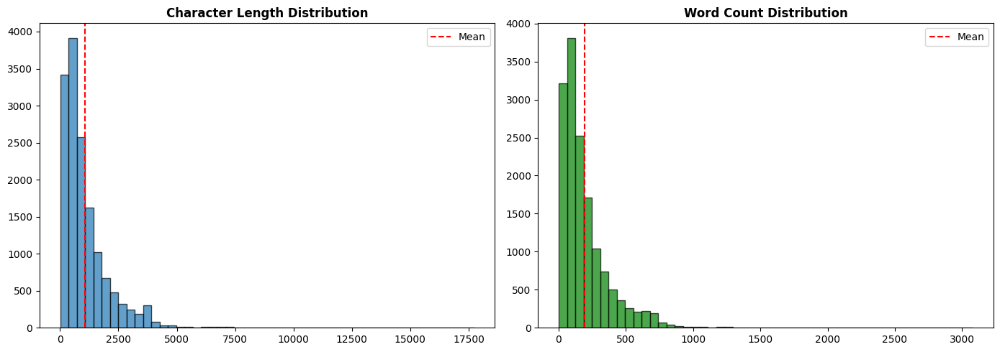

In [ ]:
# Text length analysis
df['text_length'] = df['complaint_text'].str.len()
df['word_count'] = df['complaint_text'].str.split().str.len()

print("Text Length Statistics:")
print(df[['text_length', 'word_count']].describe())

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(df['text_length'], bins=50, edgecolor='black', alpha=0.7)
axes[0].set_title('Character Length Distribution', fontsize=12, fontweight='bold')
axes[0].axvline(df['text_length'].mean(), color='red', linestyle='--', label='Mean')
axes[0].legend()

axes[1].hist(df['word_count'], bins=50, edgecolor='black', alpha=0.7, color='green')
axes[1].set_title('Word Count Distribution', fontsize=12, fontweight='bold')
axes[1].axvline(df['word_count'].mean(), color='red', linestyle='--', label='Mean')
axes[1].legend()

plt.tight_layout()
plt.show()

## 2.3 Word Cloud

In [ ]:
# Visualization
from wordcloud import WordCloud

# Settings
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline

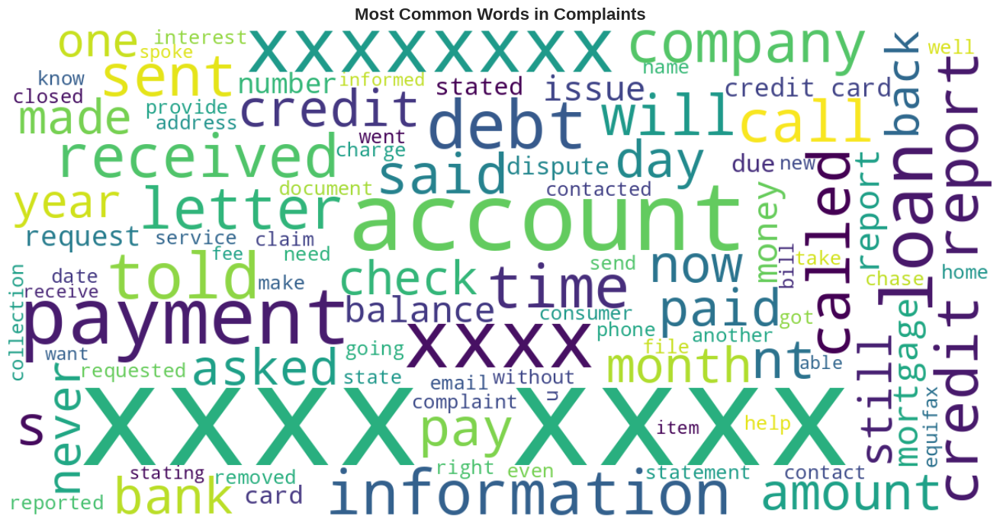

In [ ]:
# Generate word cloud from sample
sample_text = ' '.join(df['complaint_text'].head(1000).str.lower())
sample_text = re.sub(r'[^a-zA-Z\s]', '', sample_text)

wordcloud = WordCloud(width=1200, height=600, background_color='white',
                      colormap='viridis', max_words=100).generate(sample_text)

plt.figure(figsize=(14, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Common Words in Complaints', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

<a id='phase3'></a>
# Phase 3: Feature Engineering with TensorFlow

## 3.1 TensorFlow Text Preprocessing Layer

**Key Concept:** Instead of using sklearn/nltk, we'll use `tf.keras.layers.TextVectorization`

**Benefits:**
- Preprocessing becomes part of the model
- GPU acceleration
- No external dependencies in production
- Automatic handling of vocabulary

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

In [ ]:
'''
# Replace this part since it's not compatible with keras in GCS
# Create text standardization function using TensorFlow ops
@tf.keras.utils.register_keras_serializable(package='Custom', name='custom_standardization')
def custom_standardization(input_data):
    """
    Custom text standardization using TensorFlow string ops
    """
    # Lowercase
    lowercase = tf.strings.lower(input_data)
    # Remove HTML tags
    no_html = tf.strings.regex_replace(lowercase, '<[^>]+>', ' ')
    # Remove URLs
    no_urls = tf.strings.regex_replace(no_html, r'http\S+|www\S+', ' ')
    # Remove emails
    no_emails = tf.strings.regex_replace(no_urls, r'\S+@\S+', ' ')
    # Remove XXXX (redacted info)
    no_redacted = tf.strings.regex_replace(no_emails, r'x{2,}', ' ')
    # Remove numbers
    no_numbers = tf.strings.regex_replace(no_redacted, r'\d+', ' ')
    # Remove punctuation except hyphens (keep compound words)
    no_punct = tf.strings.regex_replace(no_numbers, r'[^a-z\s\-]', ' ')
    # Remove extra whitespace
    cleaned = tf.strings.regex_replace(no_punct, r'\s+', ' ')
    return tf.strings.strip(cleaned)

# Test the function
test_text = "I paid $500 on 01/15/2024 but XXXX reported it wrong! Contact me at test@email.com"
print("Original:", test_text)
print("Cleaned:", custom_standardization(tf.constant(test_text)).numpy().decode('utf-8'))
'''

'\n# Replace this part since it\'s not compatible with keras in GCS\n# Create text standardization function using TensorFlow ops\n@tf.keras.utils.register_keras_serializable(package=\'Custom\', name=\'custom_standardization\')\ndef custom_standardization(input_data):\n    """\n    Custom text standardization using TensorFlow string ops\n    """\n    # Lowercase\n    lowercase = tf.strings.lower(input_data)\n    # Remove HTML tags\n    no_html = tf.strings.regex_replace(lowercase, \'<[^>]+>\', \' \')\n    # Remove URLs\n    no_urls = tf.strings.regex_replace(no_html, r\'http\\S+|www\\S+\', \' \')\n    # Remove emails\n    no_emails = tf.strings.regex_replace(no_urls, r\'\\S+@\\S+\', \' \')\n    # Remove XXXX (redacted info)\n    no_redacted = tf.strings.regex_replace(no_emails, r\'x{2,}\', \' \')\n    # Remove numbers\n    no_numbers = tf.strings.regex_replace(no_redacted, r\'\\d+\', \' \')\n    # Remove punctuation except hyphens (keep compound words)\n    no_punct = tf.strings.regex_r

## 3.2 Create TensorFlow TextVectorization Layer

In [ ]:
# Configuration
MAX_VOCAB_SIZE = 10000
MAX_SEQUENCE_LENGTH = 200

# Create TextVectorization layer
vectorize_layer = layers.TextVectorization(
    standardize='lower_and_strip_punctuation',
    max_tokens=MAX_VOCAB_SIZE,
    output_mode='int',
    output_sequence_length=MAX_SEQUENCE_LENGTH,
    name='text_vectorization'
)

print(f"TextVectorization layer created")
print(f"   Max vocabulary: {MAX_VOCAB_SIZE}")
print(f"   Sequence length: {MAX_SEQUENCE_LENGTH}")

TextVectorization layer created
   Max vocabulary: 10000
   Sequence length: 200


## 3.3 Prepare Data with TensorFlow

In [ ]:
# Encode labels using TensorFlow
# Create string lookup layer for labels
label_encoder = layers.StringLookup(output_mode='int',num_oov_indices=0)

# Get unique labels
unique_labels = df['Product'].unique()
label_encoder.adapt(unique_labels)

# Get actual number of classes
num_classes = len(unique_labels)
print(f"Number of classes: {num_classes}")

# Verify encoding
print(f"\nLabel encoding (first 5):")
for i, label in enumerate(unique_labels[:5]):
    encoded = label_encoder(label)
    print(f"  {label[:50]}: {encoded.numpy()}")
print(f"  ... and {num_classes - 5} more")

# Verify max label value
print(f"\nLabel range: 0 to {num_classes - 1}")
print(f"   Model output classes: {num_classes}")

Number of classes: 18

Label encoding (first 5):
  Credit reporting, credit repair services, or other: 11
  Mortgage: 7
  Credit card: 14
  Debt collection: 10
  Checking or savings account: 16
  ... and 13 more

Label range: 0 to 17
   Model output classes: 18


## 3.4 Create TensorFlow Datasets (tf.data.Dataset)



In [ ]:
df['Product'].value_counts()

,Product
Debt collection,3555
"Credit reporting, credit repair services, or other personal consumer reports",2568
Mortgage,2351
Credit reporting,1732
Credit card,982
Student loan,866
Bank account or service,801
Credit card or prepaid card,586
Consumer Loan,490
Checking or savings account,367


In [ ]:
import tensorflow_data_validation as tfdv
from tensorflow_metadata.proto.v0 import schema_pb2

# Define the 10 allowed product categories including 'Other'
ALLOWED_PRODUCTS = [
    'Credit card',
    'Mortgage',
    'Bank account or service',
    'Credit reporting',
    'Debt collection',
    'Student loan',
    'Consumer Loan',
    'Money transfer',
    'Personal loan',
    'Other'
]

# Create a mapping function for original product categories to the 10 groups
def map_product_to_10_groups(product_name):
    # Convert to lowercase for robust matching
    product_name_lower = product_name.lower()

    # Map similar categories to one of the main 9 categories
    if 'credit reporting' in product_name_lower or 'credit repair services' in product_name_lower:
        return 'Credit reporting'
    elif 'credit card' in product_name_lower:
        return 'Credit card'
    elif 'bank account' in product_name_lower or 'checking' in product_name_lower or 'savings account' in product_name_lower:
        return 'Bank account or service'
    elif 'money transfer' in product_name_lower:
        return 'Money transfer'
    elif 'payday loan' in product_name_lower or 'title loan' in product_name_lower or 'personal loan' in product_name_lower:
        return 'Personal loan'
    elif 'mortgage' in product_name_lower:
        return 'Mortgage'
    elif 'debt collection' in product_name_lower:
        return 'Debt collection'
    elif 'student loan' in product_name_lower :
        return 'Student loan'
    elif 'consumer loan' in product_name_lower :
        return 'Consumer Loan'
    else:
        # Catch-all for any other categories not explicitly mapped
        return 'Other'

# Apply the mapping to the 'Product' column in the DataFrame
df['Product'] = df['Product'].apply(map_product_to_10_groups)

# Generate initial schema using the grouped product categories
stats = tfdv.generate_statistics_from_dataframe(df)
schema = tfdv.infer_schema(statistics=stats)

# Set domain constraint using the 10 explicitly defined categories
tfdv.set_domain(schema, 'Product', schema_pb2.StringDomain(
    value=ALLOWED_PRODUCTS
))

# Now validate data against schema
anomalies = tfdv.validate_statistics(statistics=stats, schema=schema)

# Display anomalies
print("TFDV Anomalies after grouping:")
tfdv.display_anomalies(anomalies)

anomaly_info = anomalies.anomaly_info
if 'Product' in anomaly_info:
    print("Products that still need grouping (should be empty if mapping is correct): ", anomaly_info['Product'])
else:
    print("\nAll product categories successfully grouped into the 10 allowed categories.")

# Update unique_labels and num_classes for the rest of the notebook based on the new df
global unique_labels # Ensure this global variable is updated
global num_classes   # Ensure this global variable is updated
unique_labels = df['Product'].unique()
num_classes = len(unique_labels)
print(f"\nUpdated Number of classes after grouping: {num_classes}")
print(f"Updated Unique products after grouping: {unique_labels}")

TFDV Anomalies after grouping:



All product categories successfully grouped into the 10 allowed categories.

Updated Number of classes after grouping: 10
Updated Unique products after grouping: ['Credit reporting' 'Mortgage' 'Credit card' 'Debt collection'
 'Bank account or service' 'Money transfer' 'Other' 'Student loan'
 'Personal loan' 'Consumer Loan']


In [ ]:
# Split data
from sklearn.model_selection import train_test_split

# Split: 70% train, 15% val, 15% test
train_df, temp_df = train_test_split(df, test_size=0.3, random_state=RANDOM_SEED, stratify=df['Product'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=RANDOM_SEED)

print(f"Train: {len(train_df)} ({len(train_df)/len(df)*100:.1f}%)")
print(f"Val:   {len(val_df)} ({len(val_df)/len(df)*100:.1f}%)")
print(f"Test:  {len(test_df)} ({len(test_df)/len(df)*100:.1f}%)")

Train: 10500 (70.0%)
Val:   2250 (15.0%)
Test:  2250 (15.0%)


In [ ]:
# Create TensorFlow datasets
BATCH_SIZE = 128
AUTOTUNE = tf.data.AUTOTUNE

def create_tf_dataset(dataframe, is_training=True):
    """
    Create TensorFlow dataset with preprocessing
    """
    # Extract text and labels
    texts = dataframe['complaint_text'].values
    labels = dataframe['Product'].values

    # Create dataset
    dataset = tf.data.Dataset.from_tensor_slices((texts, labels))

    if is_training:
        # Shuffle for training
        dataset = dataset.shuffle(buffer_size=10000, seed=RANDOM_SEED)

    # Batch
    dataset = dataset.batch(BATCH_SIZE)

    # Prefetch for performance
    dataset = dataset.prefetch(buffer_size=AUTOTUNE)

    return dataset

# Create datasets
train_ds = create_tf_dataset(train_df, is_training=True)
val_ds = create_tf_dataset(val_df, is_training=False)
test_ds = create_tf_dataset(test_df, is_training=False)

print("TensorFlow datasets created")
print(f"   Batch size: {BATCH_SIZE}")
print(f"   Prefetching: Enabled (AUTOTUNE)")

TensorFlow datasets created
   Batch size: 128
   Prefetching: Enabled (AUTOTUNE)


## 3.5 Adapt Vectorization Layer on Training Data

**Important:** We fit the vocabulary ONLY on training data

In [ ]:
# Adapt vectorization layer on training texts only
train_texts = train_df['complaint_text'].values
vectorize_layer.adapt(train_texts)

# Re-adapt label_encoder with the updated unique_labels (10 categories)
label_encoder.adapt(unique_labels)

print("Vectorization layer adapted on training data")
print("Label encoder re-adapted to 10 unique product categories")
print(f"   Vocabulary size (text): {len(vectorize_layer.get_vocabulary())}")
print(f"   Number of classes (labels): {len(label_encoder.get_vocabulary())}")

print(f"\nTop 20 tokens in vocabulary:")
vocab = vectorize_layer.get_vocabulary()
for i, token in enumerate(vocab[:20]):
    print(f"  {i}: '{token}'")

# Test vectorization
sample_text = "I have a problem with my credit card payment"
vectorized = vectorize_layer(tf.constant([sample_text]))
print(f"\nSample vectorization:")
print(f"Input: {sample_text}")
print(f"Output shape: {vectorized.shape}")
print(f"Output (first 20 tokens): {vectorized[0, :20].numpy()}")

Vectorization layer adapted on training data
Label encoder re-adapted to 10 unique product categories
   Vocabulary size (text): 10000
   Number of classes (labels): 10

Top 20 tokens in vocabulary:
  0: ''
  1: '[UNK]'
  2: 'xxxx'
  3: 'the'
  4: 'i'
  5: 'to'
  6: 'and'
  7: 'my'
  8: 'a'
  9: 'of'
  10: 'that'
  11: 'was'
  12: 'they'
  13: 'in'
  14: 'on'
  15: 'have'
  16: 'this'
  17: 'not'
  18: 'for'
  19: 'me'

Sample vectorization:
Input: I have a problem with my credit card payment
Output shape: (1, 200)
Output (first 20 tokens): [  4  15   8 320  21   7  22  65  37   0   0   0   0   0   0   0   0   0
   0   0]


<a id='phase4'></a>
# Phase 4: Model Training Pipeline

## 4.1 Create Model Factory with Built-in Preprocessing

**Note:** Preprocessing layers are INSIDE the model

In [ ]:
class ComplaintClassifierFactory:
    """
    Factory for creating models with built-in preprocessing
    """

    def __init__(self, vectorize_layer, label_encoder, num_classes):
        self.vectorize_layer = vectorize_layer
        self.label_encoder = label_encoder
        self.num_classes = num_classes

    def create_model(self, config):
        """
        Create model with preprocessing built-in
        """
        # Input: raw text strings!
        text_input = layers.Input(shape=(1,), dtype=tf.string, name='text_input')

        # Preprocessing layers (part of the model!)
        x = self.vectorize_layer(text_input)

        # Embedding
        x = layers.Embedding(
            input_dim=MAX_VOCAB_SIZE,
            output_dim=config['embedding_dim'],
            mask_zero=True,
            name='embedding'
        )(x)

        # Dropout
        x = layers.SpatialDropout1D(0.2)(x)

        # LSTM/BiLSTM
        if config['use_bidirectional']:
            x = layers.Bidirectional(
                layers.LSTM(config['lstm_units'], return_sequences=config['use_cnn']),
                name='bilstm'
            )(x)
        else:
            x = layers.LSTM(
                config['lstm_units'],
                return_sequences=config['use_cnn'],
                name='lstm'
            )(x)

        x = layers.Dropout(0.3)(x)

        # Optional CNN
        if config['use_cnn']:
            x = layers.Conv1D(64, 3, padding='same', activation='relu', name='conv1d')(x)
            x = layers.GlobalMaxPooling1D(name='global_pooling')(x)

        # Dense layers
        for i, units in enumerate(config['dense_units']):
            x = layers.Dense(units, activation='relu', name=f'dense_{i+1}')(x)
            x = layers.Dropout(0.3)(x)

        # Output
        output = layers.Dense(self.num_classes, activation='softmax', name='output')(x)

        # Create model
        model = models.Model(inputs=text_input, outputs=output, name=config['model_name'])

        # Compile
        model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=config['learning_rate']),
            loss='sparse_categorical_crossentropy',  # Note: sparse because we use integer labels
            metrics=[
                'accuracy',
                keras.metrics.SparseTopKCategoricalAccuracy(k=3, name='top3_acc')
            ]
        )

        return model

# Create factory
model_factory = ComplaintClassifierFactory(vectorize_layer, label_encoder, num_classes)

print("Model Factory created")
print("Models will accept raw text as input")
print("No separate preprocessing needed in production")

Model Factory created
Models will accept raw text as input
No separate preprocessing needed in production


## 4.2 Create Training Pipeline Class

In [ ]:
class TensorFlowPipeline:
    """
    Complete training pipeline using TensorFlow end-to-end
    """

    def __init__(self, model_factory, config):
        self.model_factory = model_factory
        self.config = config
        self.model = None
        self.history = None

    def prepare_datasets(self, train_ds, val_ds):
        """
        Prepare datasets with label encoding
        """
        def encode_labels(text, label):
            # Encode label using StringLookup layer
            encoded_label = self.model_factory.label_encoder(label)
            return text, encoded_label

        train_ds = train_ds.map(encode_labels, num_parallel_calls=tf.data.AUTOTUNE)
        val_ds = val_ds.map(encode_labels, num_parallel_calls=tf.data.AUTOTUNE)

        return train_ds, val_ds

    def build_and_compile(self):
        """
        Build model using factory
        """
        print(f"Building model: {self.config['model_name']}")
        self.model = self.model_factory.create_model(self.config)
        return self.model

    def train(self, train_ds, val_ds):
        """
        Train the model
        """
        # Build model if not already built
        if self.model is None:
            self.build_and_compile()

        # Prepare datasets
        train_ds, val_ds = self.prepare_datasets(train_ds, val_ds)

        # Callbacks
        log_dir = f"logs/fit/{datetime.now().strftime('%Y%m%d-%H%M%S')}_{self.config['model_name']}"
        os.makedirs('models', exist_ok=True)

        callback_list = [
            callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1),
            callbacks.EarlyStopping(
                monitor='val_accuracy',
                patience=self.config.get('patience', 3),
                restore_best_weights=True,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                f"models/{self.config['model_name']}_best.keras",
                monitor='val_accuracy',
                save_best_only=True,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=2,
                min_lr=1e-6,
                verbose=1
            )
        ]

        # Train
        print(f"\nTraining {self.config['model_name']}...")
        self.history = self.model.fit(
            train_ds,
            validation_data=val_ds,
            epochs=self.config['epochs'],
            callbacks=callback_list,
            verbose=1
        )

        return self.history

    def evaluate(self, test_ds):
        """
        Evaluate on test set
        """
        # Prepare test dataset
        def encode_labels(text, label):
            encoded_label = self.model_factory.label_encoder(label)
            return text, encoded_label

        test_ds = test_ds.map(encode_labels, num_parallel_calls=tf.data.AUTOTUNE)

        print("Evaluating model...")
        results = self.model.evaluate(test_ds, verbose=0)

        metrics = {
            'loss': results[0],
            'accuracy': results[1],
            'top3_accuracy': results[2]
        }

        return metrics

    def run_pipeline(self, train_ds, val_ds, test_ds):
        """
        Run complete pipeline
        """
        print(f"RUNNING TENSORFLOW NATIVE PIPELINE: {self.config['model_name']}")

        # Build
        self.build_and_compile()
        self.model.summary()

        # Train
        self.train(train_ds, val_ds)

        # Evaluate
        metrics = self.evaluate(test_ds)

        print("TEST RESULTS")
        for metric, value in metrics.items():
            print(f"{metric.replace('_', ' ').title()}: {value:.4f}")

        return metrics

print("TensorFlowPipeline class created")

TensorFlowPipeline class created


## 4.3 Define Model Configurations

In [ ]:
# Configuration 1: Simple LSTM
config_simple = {
    'model_name': 'simple_lstm_tf',
    'embedding_dim': 128,
    'lstm_units': 64,
    'use_bidirectional': False,
    'use_cnn': False,
    'dense_units': [32],
    'learning_rate': 0.001,
    'epochs': 5,
    'patience': 3
}

# Configuration 2: Advanced BiLSTM + CNN
config_advanced = {
    'model_name': 'advanced_bilstm_cnn_tf',
    'embedding_dim': 150,
    'lstm_units': 128,
    'use_bidirectional': True,
    'use_cnn': True,
    'dense_units': [128, 64],
    'learning_rate': 0.001,
    'epochs': 8,
    'patience': 3
}

print("Configurations defined")
print("Available configs:")
print("1. config_simple - Baseline LSTM")
print("2. config_advanced - BiLSTM + CNN")

Configurations defined
Available configs:
1. config_simple - Baseline LSTM
2. config_advanced - BiLSTM + CNN


<a id='phase5'></a>
# Phase 5: Model Training with TensorFlow

## 5.1 Setup TensorBoard

In [ ]:
%load_ext tensorboard

## 5.2 Train Simple LSTM Model

In [ ]:
df['Product'].nunique()

10

In [ ]:
# Create pipeline
pipeline_simple = TensorFlowPipeline(model_factory, config_simple)

# Run pipeline
metrics_simple = pipeline_simple.run_pipeline(train_ds, val_ds, test_ds)

RUNNING TENSORFLOW NATIVE PIPELINE: simple_lstm_tf
Building model: simple_lstm_tf


Model: "simple_lstm_tf"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ text_input          │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ text_vectorization  │ (None, 200)       │          0 │ text_input[0][0]  │
│ (TextVectorization) │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 200, 128)  │  1,280,000 │ text_vectorizati… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d   │ (None, 200, 128)  │          0 │ embedding[0][0]   │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 200)       │          0 │ text_vectorizati… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 64)        │     49,408 │ spatial_dropout1… │
│                     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64)        │          0 │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 32)        │      2,080 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32)        │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output (Dense)      │ (None, 10)        │        330 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,331,818 (5.08 MB)

 Trainable params: 1,331,818 (5.08 MB)

 Non-trainable params: 0 (0.00 B)


Training simple_lstm_tf...
Epoch 1/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 530ms/step - accuracy: 0.2607 - loss: 2.1131 - top3_acc: 0.5564
Epoch 1: val_accuracy improved from None to 0.35067, saving model to models/simple_lstm_tf_best.keras
83/83 ━━━━━━━━━━━━━━━━━━━━ 56s 629ms/step - accuracy: 0.2898 - loss: 1.9795 - top3_acc: 0.6184 - val_accuracy: 0.3507 - val_loss: 1.7703 - val_top3_acc: 0.7289 - learning_rate: 0.0010
Epoch 2/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step - accuracy: 0.3742 - loss: 1.7195 - top3_acc: 0.6964
Epoch 2: val_accuracy improved from 0.35067 to 0.47911, saving model to models/simple_lstm_tf_best.keras
83/83 ━━━━━━━━━━━━━━━━━━━━ 37s 446ms/step - accuracy: 0.3709 - loss: 1.7202 - top3_acc: 0.6936 - val_accuracy: 0.4791 - val_loss: 1.5297 - val_top3_acc: 0.7516 - learning_rate: 0.0010
Epoch 3/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.4613 - loss: 1.5904 - top3_acc: 0.7543
Epoch 3: val_accuracy did not improve from 0.47911
83/83 ━━━━━━━━━━━━━━━━━━━━ 35s 428

## 5.3 Train Advanced BiLSTM + CNN Model

In [ ]:

# HYPERPARAMETER CONFIGURATIONS - 2 MODELS

class ModelConfigs:
    """
    Two model configurations for comparison
    """

    @staticmethod
    def get_all_configs():
        """
        Return 2 configurations to compare
        """
        configs = [
            {
                'name': 'bilstm_baseline',
                'model_name': 'bilstm_baseline',
                'model_type': 'lstm',
                'description': 'BiLSTM Baseline (Simple)',
                'use_bidirectional': True,
                'use_cnn': False,
                'lstm_units': 128,
                'embedding_dim': 128,
                'dense_units': [64, 32],
                'batch_size': 128,
                'epochs': 6,
                'learning_rate': 0.001,
                'patience': 3
            },
            {
                'name': 'bilstm_cnn_advanced',
                'model_name': 'bilstm_cnn_advanced',
                'model_type': 'lstm',
                'description': 'BiLSTM + CNN (Advanced)',
                'use_bidirectional': True,
                'use_cnn': True,
                'lstm_units': 128,
                'embedding_dim': 128,
                'dense_units': [128, 64],
                'batch_size': 128,
                'epochs': 8,
                'learning_rate': 0.001,
                'patience': 3
            },
        ]

        return configs

# Get all configurations
all_configs = ModelConfigs.get_all_configs()

print(f"\nTotal configurations to try: {len(all_configs)}")
print("\nConfigurations:")
for i, config in enumerate(all_configs, 1):
    print(f"  {i}. {config['name']}: {config['description']}")

print("\nConfigurations ready")


Total configurations to try: 2

Configurations:
  1. bilstm_baseline: BiLSTM Baseline (Simple)
  2. bilstm_cnn_advanced: BiLSTM + CNN (Advanced)

Configurations ready


In [ ]:

# TRAIN ALL MODELS - 2 MODEL COMPARISON

# Track all results
all_results = []
all_histories = {}
trained_models = {}

# Create label encoding function
def encode_labels(text, label):
    """Encode string labels to integers"""
    encoded_label = label_encoder(label)
    return text, encoded_label

# Train each configuration
for i, config in enumerate(all_configs, 1):
    print(f"[{i}/{len(all_configs)}] TRAINING: {config['name']}")
    print(f"Description: {config['description']}")

    try:
        # Build model
        print("\nBuild LSTM model")
        pipeline = TensorFlowPipeline(model_factory, config)
        model = pipeline.build_and_compile()

        # Show model summary
        print("\nModel Architecture:")
        model.summary()

        # Callbacks
        log_dir = f"logs/fit/{datetime.now().strftime('%Y%m%d-%H%M%S')}_{config['name']}"

        callback_list = [
            callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1),
            callbacks.EarlyStopping(
                monitor='val_accuracy',
                patience=config['patience'],
                restore_best_weights=True,
                verbose=1
            ),
            callbacks.ModelCheckpoint(
                f"models/{config['name']}_best.keras",
                monitor='val_accuracy',
                save_best_only=True,
                verbose=1
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=2,
                min_lr=1e-7,
                verbose=1
            )
        ]

        # Prepare datasets with encoded labels
        print("\nPrepare datasets with encoded labels")
        train_ds_config = train_ds.map(encode_labels, num_parallel_calls=AUTOTUNE)
        val_ds_config = val_ds.map(encode_labels, num_parallel_calls=AUTOTUNE)
        test_ds_config = test_ds.map(encode_labels, num_parallel_calls=AUTOTUNE)

        # Train
        print(f"\nTrain {config['name']}")
        print(f"   Epochs: {config['epochs']}")
        print(f"   Batch size: {config['batch_size']}")
        print(f"   Learning rate: {config['learning_rate']}")

        start_time = datetime.now()

        history = model.fit(
            train_ds_config,
            validation_data=val_ds_config,
            epochs=config['epochs'],
            callbacks=callback_list,
            verbose=1
        )

        end_time = datetime.now()
        training_time = (end_time - start_time).total_seconds()

        print(f"\nTraining complete! Time: {training_time:.2f}s ({training_time/60:.2f} min)")

        # Evaluate on test set
        print(f"\nEvaluate {config['name']} on test set")
        test_results = model.evaluate(test_ds_config, verbose=0)

        # Store results
        result = {
            'config_name': config['name'],
            'description': config['description'],
            'model_type': config['model_type'],
            'test_loss': float(test_results[0]),
            'test_accuracy': float(test_results[1]),
            'test_top3_accuracy': float(test_results[2]),
            'best_val_accuracy': float(max(history.history['val_accuracy'])),
            'training_time_seconds': training_time,
            'training_time_minutes': training_time / 60,
            'epochs_completed': len(history.history['loss']),
            'config': config
        }

        all_results.append(result)
        all_histories[config['name']] = history
        trained_models[config['name']] = model

        # Print results
        print(f"RESULTS: {config['name']}")
        print(f"Test Accuracy:     {result['test_accuracy']:.4f} ({result['test_accuracy']*100:.2f}%)")
        print(f"Test Top-3 Acc:    {result['test_top3_accuracy']:.4f} ({result['test_top3_accuracy']*100:.2f}%)")
        print(f"Best Val Accuracy: {result['best_val_accuracy']:.4f} ({result['best_val_accuracy']*100:.2f}%)")
        print(f"Training Time:     {result['training_time_minutes']:.2f} minutes")

    except Exception as e:
        print(f"\nError training {config['name']}: {e}")
        import traceback
        traceback.print_exc()
        continue

print("ALL TRAINING COMPLETE")
print(f"\nSuccessfully trained: {len(all_results)}/{len(all_configs)} models")

[1/2] TRAINING: bilstm_baseline
Description: BiLSTM Baseline (Simple)

Build LSTM model
Building model: bilstm_baseline

Model Architecture:


Model: "bilstm_baseline"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ text_input          │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ text_vectorization  │ (None, 200)       │          0 │ text_input[0][0]  │
│ (TextVectorization) │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 200, 128)  │  1,280,000 │ text_vectorizati… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d_1 │ (None, 200, 128)  │          0 │ embedding[0][0]   │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_1         │ (None, 200)       │          0 │ text_vectorizati… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bilstm              │ (None, 256)       │    263,168 │ spatial_dropout1… │
│ (Bidirectional)     │                   │            │ not_equal_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 256)       │          0 │ bilstm[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │     16,448 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 64)        │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 32)        │      2,080 │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 32)        │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output (Dense)      │ (None, 10)        │        330 │ dropout_4[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,562,026 (5.96 MB)

 Trainable params: 1,562,026 (5.96 MB)

 Non-trainable params: 0 (0.00 B)


Prepare datasets with encoded labels

Train bilstm_baseline
   Epochs: 6
   Batch size: 128
   Learning rate: 0.001
Epoch 1/6
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2208 - loss: 2.1376 - top3_acc: 0.5341
Epoch 1: val_accuracy improved from None to 0.41733, saving model to models/bilstm_baseline_best.keras
83/83 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.2737 - loss: 1.9642 - top3_acc: 0.6349 - val_accuracy: 0.4173 - val_loss: 1.5699 - val_top3_acc: 0.7742 - learning_rate: 0.0010
Epoch 2/6
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4526 - loss: 1.4898 - top3_acc: 0.7987
Epoch 2: val_accuracy improved from 0.41733 to 0.66533, saving model to models/bilstm_baseline_best.keras
83/83 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.5217 - loss: 1.3637 - top3_acc: 0.8194 - val_accuracy: 0.6653 - val_loss: 1.0788 - val_top3_acc: 0.8538 - learning_rate: 0.0010
Epoch 3/6
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6531 - loss: 1.0820 - top3_acc: 0.8615
Epoch 3

Model: "bilstm_cnn_advanced"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ text_input          │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ text_vectorization  │ (None, 200)       │          0 │ text_input[0][0]  │
│ (TextVectorization) │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 200, 128)  │  1,280,000 │ text_vectorizati… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d_2 │ (None, 200, 128)  │          0 │ embedding[0][0]   │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_2         │ (None, 200)       │          0 │ text_vectorizati… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bilstm              │ (None, 200, 256)  │    263,168 │ spatial_dropout1… │
│ (Bidirectional)     │                   │            │ not_equal_2[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 200, 256)  │          0 │ bilstm[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 200, 64)   │     49,216 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_pooling      │ (None, 64)        │          0 │ conv1d[0][0]      │
│ (GlobalMaxPooling1… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 128)       │      8,320 │ global_pooling[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 128)       │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │      8,256 │ dropout_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 64)        │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output (Dense)      │ (None, 10)        │        650 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,609,610 (6.14 MB)

 Trainable params: 1,609,610 (6.14 MB)

 Non-trainable params: 0 (0.00 B)


Prepare datasets with encoded labels

Train bilstm_cnn_advanced
   Epochs: 8
   Batch size: 128
   Learning rate: 0.001
Epoch 1/8
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2728 - loss: 1.9917 - top3_acc: 0.6317
Epoch 1: val_accuracy improved from None to 0.57067, saving model to models/bilstm_cnn_advanced_best.keras
83/83 ━━━━━━━━━━━━━━━━━━━━ 183s 2s/step - accuracy: 0.3600 - loss: 1.7725 - top3_acc: 0.7004 - val_accuracy: 0.5707 - val_loss: 1.3001 - val_top3_acc: 0.8178 - learning_rate: 0.0010
Epoch 2/8
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5993 - loss: 1.2191 - top3_acc: 0.8138
Epoch 2: val_accuracy improved from 0.57067 to 0.70000, saving model to models/bilstm_cnn_advanced_best.keras
83/83 ━━━━━━━━━━━━━━━━━━━━ 190s 2s/step - accuracy: 0.6326 - loss: 1.1457 - top3_acc: 0.8349 - val_accuracy: 0.7000 - val_loss: 0.9803 - val_top3_acc: 0.8813 - learning_rate: 0.0010
Epoch 3/8
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7237 - loss: 0.9256 - top3_acc: 0.

## 5.4 Compare Models


              Model              Description Test Accuracy Top-3 Accuracy Val Accuracy Time (min)  Epochs
    bilstm_baseline BiLSTM Baseline (Simple)        75.38%         89.96%       74.58%       12.6       6
bilstm_cnn_advanced  BiLSTM + CNN (Advanced)        76.76%         91.51%       77.07%       20.0       8

Comparison saved: models/model_comparison.csv
Comparison plot saved: figures/model_comparison_2models.png


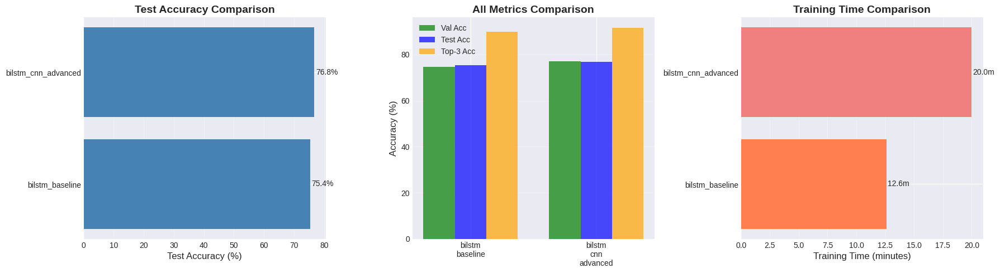

BEST MODEL:
Model: bilstm_cnn_advanced
Description: BiLSTM + CNN (Advanced)
Test Accuracy: 76.76%
Top-3 Accuracy: 91.51%
Training Time: 19.99 minutes

Best model saved: models/complete_complaint_classifier_tf.keras


In [ ]:

# MODEL COMPARISON

if len(all_results) == 0:
    print("No models were successfully trained")
else:
    # Create comparison dataframe
    comparison_data = []
    for result in all_results:
        comparison_data.append({
            'Model': result['config_name'],
            'Description': result['description'],
            'Test Accuracy': f"{result['test_accuracy']*100:.2f}%",
            'Top-3 Accuracy': f"{result['test_top3_accuracy']*100:.2f}%",
            'Val Accuracy': f"{result['best_val_accuracy']*100:.2f}%",
            'Time (min)': f"{result['training_time_minutes']:.1f}",
            'Epochs': result['epochs_completed']
        })

    comparison_df = pd.DataFrame(comparison_data)

    print("\n" + comparison_df.to_string(index=False))

    # Save comparison
    comparison_df.to_csv('models/model_comparison.csv', index=False)
    print("\nComparison saved: models/model_comparison.csv")

    # Visualize comparison
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Extract numeric values for plotting
    model_names = [r['config_name'] for r in all_results]
    test_acc = [r['test_accuracy']*100 for r in all_results]
    val_acc = [r['best_val_accuracy']*100 for r in all_results]
    top3_acc = [r['test_top3_accuracy']*100 for r in all_results]
    train_time = [r['training_time_minutes'] for r in all_results]

    # Plot 1: Test Accuracy Comparison
    axes[0].barh(model_names, test_acc, color='steelblue')
    axes[0].set_xlabel('Test Accuracy (%)', fontsize=12)
    axes[0].set_title('Test Accuracy Comparison', fontsize=14, fontweight='bold')
    axes[0].grid(axis='x', alpha=0.3)
    for i, v in enumerate(test_acc):
        axes[0].text(v + 0.5, i, f'{v:.1f}%', va='center')

    # Plot 2: All Metrics
    x_pos = np.arange(len(model_names))
    width = 0.25
    axes[1].bar(x_pos - width, val_acc, width, label='Val Acc', color='green', alpha=0.7)
    axes[1].bar(x_pos, test_acc, width, label='Test Acc', color='blue', alpha=0.7)
    axes[1].bar(x_pos + width, top3_acc, width, label='Top-3 Acc', color='orange', alpha=0.7)
    axes[1].set_ylabel('Accuracy (%)', fontsize=12)
    axes[1].set_title('All Metrics Comparison', fontsize=14, fontweight='bold')
    axes[1].set_xticks(x_pos)
    axes[1].set_xticklabels([name.replace('_', '\n') for name in model_names])
    axes[1].legend()
    axes[1].grid(axis='y', alpha=0.3)

    # Plot 3: Training Time
    colors = ['coral' if t == min(train_time) else 'lightcoral' for t in train_time]
    axes[2].barh(model_names, train_time, color=colors)
    axes[2].set_xlabel('Training Time (minutes)', fontsize=12)
    axes[2].set_title('Training Time Comparison', fontsize=14, fontweight='bold')
    axes[2].grid(axis='x', alpha=0.3)
    for i, v in enumerate(train_time):
        axes[2].text(v + 0.1, i, f'{v:.1f}m', va='center')

    plt.tight_layout()

    # CREATE FIGURES DIRECTORY
    import os
    os.makedirs('figures', exist_ok=True)

    plt.savefig('figures/model_comparison_2models.png', dpi=150, bbox_inches='tight')
    print("Comparison plot saved: figures/model_comparison_2models.png")
    plt.show()

    # Find best model
    best_idx = np.argmax([r['test_accuracy'] for r in all_results])
    best_result = all_results[best_idx]

    print("BEST MODEL:")
    print(f"Model: {best_result['config_name']}")
    print(f"Description: {best_result['description']}")
    print(f"Test Accuracy: {best_result['test_accuracy']*100:.2f}%")
    print(f"Top-3 Accuracy: {best_result['test_top3_accuracy']*100:.2f}%")
    print(f"Training Time: {best_result['training_time_minutes']:.2f} minutes")


    # Save best model
    best_model = trained_models[best_result['config_name']]
    best_model.save('models/complete_complaint_classifier_tf.keras')
    print(f"\nBest model saved: models/complete_complaint_classifier_tf.keras")

## 5.5 Plot Training History

Training histories saved: figures/training_histories_2models.png


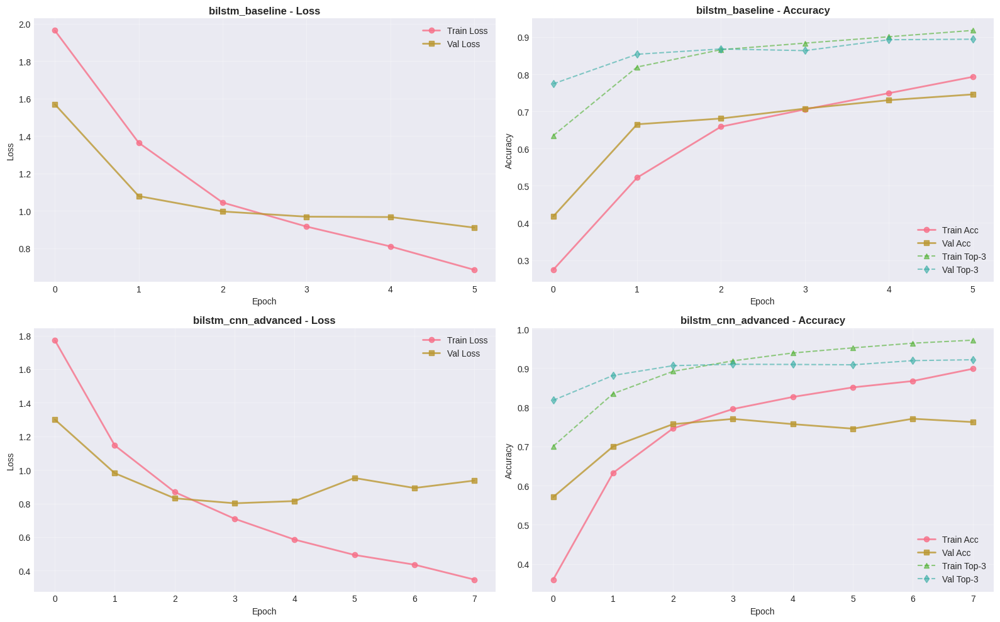

In [ ]:

# PLOT TRAINING HISTORIES

if len(all_histories) > 0:

    # Plot training history for each model
    num_models = len(all_histories)
    fig, axes = plt.subplots(num_models, 2, figsize=(16, 5*num_models))

    if num_models == 1:
        axes = axes.reshape(1, -1)

    for i, (model_name, history) in enumerate(all_histories.items()):
        # Loss plot
        axes[i, 0].plot(history.history['loss'], 'o-', label='Train Loss', alpha=0.8, linewidth=2)
        axes[i, 0].plot(history.history['val_loss'], 's-', label='Val Loss', alpha=0.8, linewidth=2)
        axes[i, 0].set_title(f'{model_name} - Loss', fontsize=12, fontweight='bold')
        axes[i, 0].set_xlabel('Epoch')
        axes[i, 0].set_ylabel('Loss')
        axes[i, 0].legend()
        axes[i, 0].grid(alpha=0.3)

        # Accuracy plot
        axes[i, 1].plot(history.history['accuracy'], 'o-', label='Train Acc', alpha=0.8, linewidth=2)
        axes[i, 1].plot(history.history['val_accuracy'], 's-', label='Val Acc', alpha=0.8, linewidth=2)
        if 'top3_acc' in history.history:
            axes[i, 1].plot(history.history['top3_acc'], '^--', label='Train Top-3', alpha=0.6)
            axes[i, 1].plot(history.history['val_top3_acc'], 'd--', label='Val Top-3', alpha=0.6)
        axes[i, 1].set_title(f'{model_name} - Accuracy', fontsize=12, fontweight='bold')
        axes[i, 1].set_xlabel('Epoch')
        axes[i, 1].set_ylabel('Accuracy')
        axes[i, 1].legend()
        axes[i, 1].grid(alpha=0.3)

    plt.tight_layout()

    # CREATE FIGURES DIRECTORY
    import os
    os.makedirs('figures', exist_ok=True)

    plt.savefig('figures/training_histories_2models.png', dpi=150, bbox_inches='tight')
    print("Training histories saved: figures/training_histories_2models.png")
    plt.show()

## 5.6 Launch TensorBoard

In [ ]:

# TENSORBOARD

# Load TensorBoard extension
%load_ext tensorboard

# Launch TensorBoard
%tensorboard --logdir logs/fit

print("   Compare both models' training metrics")

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

   Compare both models' training metrics


## 5.7 Prepare file for downloading

In [ ]:

# CREATE MISSING METADATA FILES

import json
import os
from datetime import datetime

# Ensure models directory exists
os.makedirs('models', exist_ok=True)

# CREATE LABEL MAPPING label_mapping.json
print(f"   Create Label mapping")
# Get the label encoder vocabulary (from training code)
vocab_list = label_encoder.get_vocabulary()

# Create mappings
id_to_product = {i: vocab_list[i] for i in range(len(vocab_list))}
product_to_id = {vocab_list[i]: i for i in range(len(vocab_list))}
num_classes = len(vocab_list)

label_mapping = {
    'id_to_product': id_to_product,
    'product_to_id': product_to_id,
    'num_classes': num_classes
}

with open('models/label_mapping.json', 'w') as f:
    json.dump(label_mapping, f, indent=2)

print(f"   Label mapping created")
print(f"   Classes: {num_classes}")
print(f"   Sample: {list(id_to_product.items())[:3]}")


# CREATE MODEL METADATA


print("\n Create model_metadata.json")

# Get best model results
if len(all_results) > 0:
    best_result = max(all_results, key=lambda x: x['test_accuracy'])

    metadata = {
        'model_name': best_result['config_name'],
        'version': '1.0.0',
        'training_date': datetime.now().isoformat(),
        'framework': 'TensorFlow',
        'keras_version': tf.__version__,
        'best_config': best_result['config_name'],
        'performance': {
            'test_accuracy': best_result['test_accuracy'],
            'test_top3_accuracy': best_result['test_top3_accuracy'],
            'validation_accuracy': best_result['best_val_accuracy'],
            'test_loss': best_result['test_loss']
        },
        'training_info': {
            'epochs_completed': best_result['epochs_completed'],
            'training_time_minutes': best_result['training_time_minutes'],
            'batch_size': best_result['config']['batch_size'],
            'learning_rate': best_result['config']['learning_rate']
        },
        'model_architecture': {
            'type': 'BiLSTM+CNN' if best_result['config']['use_cnn'] else 'BiLSTM',
            'lstm_units': best_result['config']['lstm_units'],
            'embedding_dim': best_result['config']['embedding_dim'],
            'use_bidirectional': best_result['config']['use_bidirectional'],
            'use_cnn': best_result['config']['use_cnn'],
            'dense_units': best_result['config']['dense_units']
        },
        'data_info': {
            'num_classes': num_classes,
            'sample_size': len(df),
            'train_size': len(train_df),
            'val_size': len(val_df),
            'test_size': len(test_df)
        },
        'input_format': 'raw_text_string',
        'preprocessing': 'built_into_model',
        'trained_on': 'Google Colab',
        'gpu_used': 'T4 (Google Colab)'
    }
else:
    # Fallback if no results
    metadata = {
        'model_name': 'BiLSTM+CNN Complaint Classifier',
        'version': '1.0.0',
        'training_date': datetime.now().isoformat(),
        'framework': 'TensorFlow',
        'note': 'Metadata created manually'
    }

with open('models/model_metadata.json', 'w') as f:
    json.dump(metadata, f, indent=2)

print(f"   Model metadata created")
print(f"   Best model: {metadata['model_name']}")
print(f"   Test accuracy: {metadata.get('performance', {}).get('test_accuracy', 0)*100:.2f}%")


# CREATE TEST CASES


print("\n Creating test_cases.json")

# Get some actual product names from data
sample_products = df['Product'].unique()[:5]

test_cases = [
    {
        'complaint': 'Debt collector keeps calling me repeatedly and harassing me',
        'expected_category': 'Debt collection',
        'test_type': 'common'
    },
    {
        'complaint': 'Received foreclosure notice on my mortgage payment',
        'expected_category': 'Mortgage',
        'test_type': 'common'
    },
    {
        'complaint': 'Unauthorized charges on my credit card statement',
        'expected_category': 'Credit card',
        'test_type': 'common'
    },
    {
        'complaint': 'Student loan servicer reported wrong information to credit bureau',
        'expected_category': 'Student loan',
        'test_type': 'common'
    },
    {
        'complaint': 'Bank charged overdraft fees without authorization',
        'expected_category': 'Checking or savings account',
        'test_type': 'common'
    },
    {
        'complaint': 'Credit report has incorrect information and errors',
        'expected_category': 'Credit reporting',
        'test_type': 'common'
    },
    {
        'complaint': 'Vehicle loan company repossessed my car incorrectly',
        'expected_category': 'Vehicle loan or lease',
        'test_type': 'edge_case'
    },
    {
        'complaint': 'Payday lender charged excessive interest and fees',
        'expected_category': 'Payday loan',
        'test_type': 'edge_case'
    }
]

with open('models/test_cases.json', 'w') as f:
    json.dump(test_cases, f, indent=2)

print(f"   Test cases created")
print(f"   Total cases: {len(test_cases)}")


# VERIFY ALL FILES EXIST


print("VERIFICATION")

required_files = [
    'models/complete_complaint_classifier_tf.keras',
    'models/label_mapping.json',
    'models/model_metadata.json',
    'models/test_cases.json'
]

all_exist = True
for file_path in required_files:
    if os.path.exists(file_path):
        size_mb = os.path.getsize(file_path) / (1024*1024)
        print(f" {file_path} ({size_mb:.2f} MB)")
    else:
        print(f" {file_path} (MISSING)")
        all_exist = False

if all_exist:
    print("\n All files created successfully!")
else:
    print("\n  Some files are missing!")


   Create Label mapping
   Label mapping created
   Classes: 10
   Sample: [(0, 'Student loan'), (1, 'Personal loan'), (2, 'Other')]

 Create model_metadata.json
   Model metadata created
   Best model: bilstm_cnn_advanced
   Test accuracy: 76.76%

 Creating test_cases.json
   Test cases created
   Total cases: 8
VERIFICATION
 models/complete_complaint_classifier_tf.keras (18.65 MB)
 models/label_mapping.json (0.00 MB)
 models/model_metadata.json (0.00 MB)
 models/test_cases.json (0.00 MB)

 All files created successfully!


In [ ]:

# DOWNLOAD MODEL AND ARTIFACTS FOR VS CODE

from google.colab import files
import os

files_to_download = [
    'models/complete_complaint_classifier_tf.keras',
    'models/label_mapping.json',
    'models/model_metadata.json',
    'models/test_cases.json',
    'models/model_comparison.csv',
    'figures/model_comparison_2models.png',
    'figures/training_histories_2models.png'
]

for file_path in files_to_download:
    if os.path.exists(file_path):
        print(f"\n Downloading: {file_path}")
        files.download(file_path)
        print(f" Done!")
    else:
        print(f"\n  Skipping: {file_path} (not found)")


print("DOWNLOAD COMPLETE!")


 Downloading: models/complete_complaint_classifier_tf.keras


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!

 Downloading: models/label_mapping.json


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!

 Downloading: models/model_metadata.json


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!

 Downloading: models/test_cases.json


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!

 Downloading: models/model_comparison.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!

 Downloading: figures/model_comparison_2models.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!

 Downloading: figures/training_histories_2models.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 Done!
DOWNLOAD COMPLETE!


## Permanent backup

In [ ]:

# SAVE EVERYTHING TO GOOGLE DRIVE (PERMANENT BACKUP)

from google.colab import drive
import shutil
import os
from datetime import datetime


# Mount Google Drive
print("\n Mounting Google Drive...")
drive.mount('/content/drive')
print("Google Drive mounted")

# Create backup folder with timestamp
backup_name = f"MLOps_Consumer_Complaints_{datetime.now().strftime('%Y%m%d_%H%M')}"
backup_path = f"/content/drive/MyDrive/{backup_name}"

print(f"\n Creating backup folder...")
print(f"   Location: {backup_path}")
os.makedirs(backup_path, exist_ok=True)
print(" Folder created")

# Save models folder
print("\n Saving models folder...")
if os.path.exists('models'):
    shutil.copytree('models', f'{backup_path}/models', dirs_exist_ok=True)
    model_files = os.listdir('models')
    print(f"Saved {len(model_files)} files:")
    for file in model_files:
        size = os.path.getsize(f'models/{file}') / (1024*1024)
        print(f"   • {file} ({size:.2f} MB)")
else:
    print("  models/ folder not found")

# Save figures folder
print("\n Saving figures folder...")
if os.path.exists('figures'):
    shutil.copytree('figures', f'{backup_path}/figures', dirs_exist_ok=True)
    fig_files = os.listdir('figures')
    print(f" Saved {len(fig_files)} figures")
else:
    print("  figures/ folder not found")

# Save logs folder (TensorBoard data)
print("\n Saving logs folder...")
if os.path.exists('logs'):
    shutil.copytree('logs', f'{backup_path}/logs', dirs_exist_ok=True)
    print("TensorBoard logs saved")
else:
    print(" logs/ folder not found")

# Save training data info
print("\n Saving training data info...")
data_info = {
    'sample_size': len(df) if 'df' in locals() else 0,
    'train_size': len(train_df) if 'train_df' in locals() else 0,
    'val_size': len(val_df) if 'val_df' in locals() else 0,
    'test_size': len(test_df) if 'test_df' in locals() else 0,
    'num_classes': num_classes if 'num_classes' in locals() else 0,
    'saved_at': datetime.now().isoformat()
}

import json
with open(f'{backup_path}/data_info.json', 'w') as f:
    json.dump(data_info, f, indent=2)
print(" Data info saved")

# Save results summary
print("\n Saving results summary...")
if 'all_results' in locals() and len(all_results) > 0:
    results_summary = []
    for result in all_results:
        results_summary.append({
            'model': result['config_name'],
            'test_accuracy': f"{result['test_accuracy']*100:.2f}%",
            'top3_accuracy': f"{result['test_top3_accuracy']*100:.2f}%",
            'training_time': f"{result['training_time_minutes']:.1f} min"
        })

    with open(f'{backup_path}/results_summary.json', 'w') as f:
        json.dump(results_summary, f, indent=2)
    print("Results summary saved")

# Create README
print("\n Creating README...")
readme_content = f"""# MLOps Consumer Complaints - Training Backup

**Saved:** {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}

## Contents

### Models
- `complete_complaint_classifier_tf.keras` - Best trained model
- `label_mapping.json` - Product category mappings
- `model_metadata.json` - Training details and performance
- `test_cases.json` - Sample test cases
- `model_comparison.csv` - Model comparison results

### Figures
- `model_comparison_2models.png` - Model comparison visualization
- `training_histories_2models.png` - Training progress plots

### Logs
- TensorBoard training logs

## Training Results

"""

if 'all_results' in locals() and len(all_results) > 0:
    for result in all_results:
        readme_content += f"""
### {result['config_name']}
- Test Accuracy: {result['test_accuracy']*100:.2f}%
- Top-3 Accuracy: {result['test_top3_accuracy']*100:.2f}%
- Training Time: {result['training_time_minutes']:.1f} minutes
"""

readme_content += f"""

## To Restore This Session

Run this in a new Colab notebook:
```python
from google.colab import drive
import shutil

# Mount Drive
drive.mount('/content/drive')

# Restore everything
shutil.copytree('/content/drive/MyDrive/{backup_name}/models', 'models')
shutil.copytree('/content/drive/MyDrive/{backup_name}/figures', 'figures')
shutil.copytree('/content/drive/MyDrive/{backup_name}/logs', 'logs')

print("Session restored!")
```

## Notes

- All models include preprocessing (can use raw text)
- Framework: TensorFlow {tf.__version__}
- Dataset: Consumer Complaints (50K samples)
- Training: Google Colab T4 GPU
"""

with open(f'{backup_path}/README.md', 'w') as f:
    f.write(readme_content)
print(" README created")

# Calculate total backup size
print("\n Calculating backup size...")
total_size = 0
for dirpath, dirnames, filenames in os.walk(backup_path):
    for filename in filenames:
        filepath = os.path.join(dirpath, filename)
        total_size += os.path.getsize(filepath)

total_size_mb = total_size / (1024 * 1024)
print(f" Total backup size: {total_size_mb:.2f} MB")

# Final summary
print("BACKUP COMPLETE!")
print(f"\n Backup location:")
print(f"   {backup_path}")
print(f"\n Backup contents:")
print(f"   • Models: Checked")
print(f"   • Figures: Checked")
print(f"   • Logs: Checked")
print(f"   • Metadata: Checked")
print(f"   • README: Checked")
print(f"\n Total size: {total_size_mb:.2f} MB")
print(f"   Backup name: {backup_name}")



 Mounting Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted

 Creating backup folder...
   Location: /content/drive/MyDrive/MLOps_Consumer_Complaints_20251211_1752
 Folder created

 Saving models folder...
Saved 8 files:
   • complete_complaint_classifier_tf.keras (18.65 MB)
   • bilstm_cnn_advanced_best.keras (18.65 MB)
   • test_cases.json (0.00 MB)
   • simple_lstm_tf_best.keras (15.44 MB)
   • bilstm_baseline_best.keras (18.10 MB)
   • label_mapping.json (0.00 MB)
   • model_comparison.csv (0.00 MB)
   • model_metadata.json (0.00 MB)

 Saving figures folder...
 Saved 2 figures

 Saving logs folder...
TensorBoard logs saved

 Saving training data info...
 Data info saved

 Saving results summary...
Results summary saved

 Creating README...
 README created

 Calculating backup size...
 Total backup size: 71.40 MB
BACKUP COMPLETE!

 Backup location:
   /content/drive/M

<a id='phase6'></a>
# Phase 6: Model Evaluation

## 6.1 Test Model with Raw Text Input

In [ ]:
# Get best model
#best_model = pipeline_advanced.model

# Test with raw text!
test_complaints = [
    "I have unauthorized charges on my credit card and the company won't help me",
    "My mortgage payment was not processed correctly and now I'm being charged late fees",
    "The debt collector keeps calling me but I already paid this debt",
    "My student loan servicer is reporting incorrect information to credit bureaus"
]

# Predict (model takes raw strings!)
predictions = best_model.predict(tf.constant(test_complaints))

# Get predicted classes
predicted_classes = np.argmax(predictions, axis=1)

# Decode labels
vocab_list = label_encoder.get_vocabulary()

print("PREDICTIONS ON RAW TEXT")

for i, complaint in enumerate(test_complaints):
    print(f"\nComplaint {i+1}:")
    print(f"  Text: {complaint}")
    pred_idx = predicted_classes[i]
    if pred_idx < len(vocab_list):
        print(f"  Predicted Product: {vocab_list[pred_idx]}")
        print(f"  Confidence: {predictions[i][pred_idx]:.2%}")

        # Top 3
        top3_idx = np.argsort(predictions[i])[-3:][::-1]
        print(f"  Top 3:")
        for j, idx in enumerate(top3_idx, 1):
            if idx < len(vocab_list):
                print(f"    {j}. {vocab_list[idx]}: {predictions[i][idx]:.2%}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
PREDICTIONS ON RAW TEXT

Complaint 1:
  Text: I have unauthorized charges on my credit card and the company won't help me
  Predicted Product: Credit card
  Confidence: 89.39%
  Top 3:
    1. Credit card: 89.39%
    2. Credit reporting: 8.25%
    3. Debt collection: 1.91%

Complaint 2:
  Text: My mortgage payment was not processed correctly and now I'm being charged late fees
  Predicted Product: Mortgage
  Confidence: 98.98%
  Top 3:
    1. Mortgage: 98.98%
    2. Credit reporting: 0.47%
    3. Bank account or service: 0.26%

Complaint 3:
  Text: The debt collector keeps calling me but I already paid this debt
  Predicted Product: Debt collection
  Confidence: 99.95%
  Top 3:
    1. Debt collection: 99.95%
    2. Credit reporting: 0.04%
    3. Personal loan: 0.00%

Complaint 4:
  Text: My student loan servicer is reporting incorrect information to credit bureaus
  Predicted Product: Credit reporting
  Confidence: 89.90%
  Top 3:
    1. Credit rep

## 6.2 Save Complete Model

**Important:** The saved model includes ALL preprocessing!

In [ ]:
# Save complete model (includes preprocessing!)
best_model.save('models/complete_complaint_classifier_tf.keras')
best_model.export('models/complete_complaint_classifier_tf_savedmodel')

print("✅ Model saved successfully!")
print("\nSaved files:")
print("  - models/complete_complaint_classifier_tf.keras")
print("  - models/complete_complaint_classifier_tf_savedmodel/")
print("\n🎯 These models include ALL preprocessing!")
print("   No external preprocessing needed for inference")
print("   Just load and predict on raw text strings!")

## 6.3 Test Saved Model (Production Simulation)

In [ ]:
# Load saved model
loaded_model = keras.models.load_model('models/complete_complaint_classifier_tf.keras')

# Test with completely new text
new_complaint = "The bank charged me overdraft fees even though I had enough money in my account"

# Predict (no preprocessing needed!)
prediction = loaded_model.predict(tf.constant([new_complaint]))
predicted_class = np.argmax(prediction[0])

print("=" * 80)
print("PRODUCTION INFERENCE TEST")
print("=" * 80)
print(f"\nInput (raw text): {new_complaint}")
print(f"\nPredicted Class Index: {predicted_class}")
print(f"Confidence: {prediction[0][predicted_class]:.2%}")
print("\n✅ Inference works with raw text - no preprocessing code needed!")

In [ ]:
from google.colab import files

# Download the model
files.download('models/complete_complaint_classifier_tf.keras')